In [1]:
# !pip install gtfs_kit

In [2]:
# !pip uninstall --yes geopandas==0.3.0
# !pip uninstall --yes pyshp==1.2.10
# !pip uninstall --yes shapely==1.7.1

In [3]:
import gtfs_kit as gk

from src.load_mta_dataset import DATASETS, download_mta_data, load_mta_data


In [4]:
download_mta_data()

File data/gtfs_subway.zip already exists. Skipping download.
File data/gtfsmnr.zip already exists. Skipping download.
File data/gtfs_m.zip already exists. Skipping download.


In [5]:
load_mta_data()

/opt/anaconda3/lib/python3.12/site-packages/gtfs_kit/feed.py:394: DtypeWarning: Columns (7) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(p, dtype=cs.DTYPE, encoding="utf-8-sig", **csv_options)


In [6]:
DATASETS

[GTFSDataset(id='subway', url='https://rrgtfsfeeds.s3.amazonaws.com/gtfs_subway.zip', path=PosixPath('data/gtfs_subway.zip'), gk_feed=<gtfs_kit.feed.Feed object at 0x135b4c110>),
 GTFSDataset(id='metro_north_railroad', url='https://rrgtfsfeeds.s3.amazonaws.com/gtfsmnr.zip', path=PosixPath('data/gtfsmnr.zip'), gk_feed=<gtfs_kit.feed.Feed object at 0x10531ebd0>),
 GTFSDataset(id='manhattan_bus', url='https://rrgtfsfeeds.s3.amazonaws.com/gtfs_m.zip', path=PosixPath('data/gtfs_m.zip'), gk_feed=<gtfs_kit.feed.Feed object at 0x10531e090>)]

In [7]:
DATASETS[0].gk_feed.stops

,stop_id,stop_name,stop_lat,stop_lon,location_type,parent_station
0,101,Van Cortlandt Park-242 St,40.889248,-73.898583,1,<NA>
1,101N,Van Cortlandt Park-242 St,40.889248,-73.898583,<NA>,101
2,101S,Van Cortlandt Park-242 St,40.889248,-73.898583,<NA>,101
3,103,238 St,40.884667,-73.900870,1,<NA>
4,103N,238 St,40.884667,-73.900870,<NA>,103
...,...,...,...,...,...,...
1492,S30N,Tompkinsville,40.636949,-74.074835,<NA>,S30
1493,S30S,Tompkinsville,40.636949,-74.074835,<NA>,S30
1494,S31,St George,40.643748,-74.073643,1,<NA>
1495,S31N,St George,40.643748,-74.073643,<NA>,S31


In [8]:
from pathlib import Path
COMMUNITY_DISTRICTS_GEOJSON = Path("demographic_data/community_districts.geojson")
# Load the community districts GeoJSON file
import geopandas as gpd
community_districts = gpd.read_file(COMMUNITY_DISTRICTS_GEOJSON)
# Check the first few rows of the GeoDataFrame
display(community_districts.head())

,OBJECTID,BoroCD,Shape__Area,Shape__Length,geometry
0,1,308,4.560379e+07,38232.887315,"POLYGON ((-73.95829 40.67984, -73.95596 40.679..."
1,2,410,1.720774e+08,105822.377352,"MULTIPOLYGON (((-73.85722 40.65029, -73.85902 ..."
2,3,206,4.266432e+07,35875.709939,"POLYGON ((-73.87185 40.84377, -73.87192 40.843..."
3,4,480,3.277756e+07,47338.739592,"POLYGON ((-73.86272 40.76668, -73.86281 40.766..."
4,5,104,4.931005e+07,67546.045457,"POLYGON ((-73.99394 40.77319, -73.9937 40.7730..."


In [9]:
# Get all stops without a parent station
subway_data = DATASETS[0]
stops = subway_data.gk_feed.stops
stops_no_parent = stops[stops.parent_station.isna()]
stops_no_parent.head(10)

,stop_id,stop_name,stop_lat,stop_lon,location_type,parent_station
0,101,Van Cortlandt Park-242 St,40.889248,-73.898583,1,<NA>
3,103,238 St,40.884667,-73.900870,1,<NA>
6,104,231 St,40.878856,-73.904834,1,<NA>
9,106,Marble Hill-225 St,40.874561,-73.909831,1,<NA>
12,107,215 St,40.869444,-73.915279,1,<NA>
15,108,207 St,40.864621,-73.918822,1,<NA>
18,109,Dyckman St,40.860531,-73.925536,1,<NA>
21,110,191 St,40.855225,-73.929412,1,<NA>
24,111,181 St,40.849505,-73.933596,1,<NA>
27,112,168 St-Washington Hts,40.840556,-73.940133,1,<NA>


In [10]:
manhattan_bus = DATASETS[2]
manhattan_bus.gk_feed.describe()

,indicator,value
0,agencies,[MTA New York City Transit]
1,timezone,America/New_York
2,start_date,20250329
3,end_date,20250628
4,num_routes,314
5,num_trips,30307
6,num_stops,1827
7,num_shapes,155
8,sample_date,20250403
9,num_routes_active_on_sample_date,41


In [11]:
# Get all unique values of "parent_station" in the bus dataset
unique_parent_stations = manhattan_bus.gk_feed.stops.parent_station.unique()
print(unique_parent_stations)

<StringArray>
[<NA>]
Length: 1, dtype: string


In [12]:
# Plot all NYC subway stops on a map
import plotly.express as px
import plotly.io as pio
# pio.renderers.default = "notebook"

# Create a map 
map_nyc = px.scatter_map(
    stops_no_parent,
    lat="stop_lat",
    lon="stop_lon",
    hover_name="stop_name",
    zoom=9,
    height=600,
    width=800,
)

map_nyc.update_layout(mapbox_style="open-street-map", title_text="NYC Subway Stops")
map_nyc.show()

#### Conjecture 

Extremely affluent (higher income) areas will have none to very few stops 


In [16]:
from src.load_demographic_data import load_demographic_data, DEMOGRAPHIC_DATASETS

# Load demographic data
load_demographic_data()

# Get the median income and population datasets
median_income_data = DEMOGRAPHIC_DATASETS[0]
total_population_data = DEMOGRAPHIC_DATASETS[1]

print()

# Check the first few rows of the median income dataset
display(median_income_data.dataframe.head())

# Check the columns of the median income dataset
print(median_income_data.dataframe.columns)

# Check the first few rows of the total population dataset
display(total_population_data.dataframe.head())

# Check the columns of the total population dataset
print(total_population_data.dataframe.columns)

Loaded Median Incomes from demographic_data/median_incomes.csv
Loaded Total Population from demographic_data/total_population.csv
Loaded Total Population by Race Ethnicity from demographic_data/total_population_by_race_ethnicity.csv
Loaded Total Population by Age Group from demographic_data/total_population_by_age_group.csv



,Location,Household Type,TimeFrame,DataFormat,Data,Fips
0,Astoria,All Households,2023,Dollars,84590,401
1,Astoria,Families,2023,Dollars,94918,401
2,Astoria,Families with Children,2023,Dollars,85568,401
3,Astoria,Families without Children,2023,Dollars,110222,401
4,Battery Park/Tribeca,All Households,2023,Dollars,198945,101


Index(['Location', 'Household Type', 'TimeFrame', 'DataFormat', 'Data',
       'Fips'],
      dtype='object')


,Location,TimeFrame,DataFormat,Data,Fips
0,Battery Park/Tribeca,2005,Number,51150.45963,101
1,Greenwich Village,2005,Number,75508.54037,102
2,Lower East Side,2005,Number,145556.00000,103
3,Chelsea/Clinton,2005,Number,88754.39184,104
4,Midtown Business District,2005,Number,44420.60816,105


Index(['Location', 'TimeFrame', 'DataFormat', 'Data', 'Fips'], dtype='object')


In [17]:
# Filter for All Households aggregated numbers 
most_recent_timeframe = median_income_data.dataframe["TimeFrame"].max()


filtered_median_income_data = median_income_data.dataframe[median_income_data.dataframe['Household Type'] == "All Households"]
filtered_median_income_data = filtered_median_income_data[filtered_median_income_data['TimeFrame'] == most_recent_timeframe]

In [18]:
filtered_median_income_data.head()

,Location,Household Type,TimeFrame,DataFormat,Data,Fips
0,Astoria,All Households,2023,Dollars,84590,401
4,Battery Park/Tribeca,All Households,2023,Dollars,198945,101
8,Bay Ridge,All Households,2023,Dollars,88566,310
12,Bayside,All Households,2023,Dollars,107607,411
16,Bedford Park,All Households,2023,Dollars,42387,207


In [19]:
stops_combined

,stop_id,stop_name,stop_lat,stop_lon,location_type,parent_station,stop_type,stop_desc,zone_id,stop_url
0,101,Van Cortlandt Park-242 St,40.889248,-73.898583,1,<NA>,Subway,<NA>,<NA>,<NA>
1,103,238 St,40.884667,-73.900870,1,<NA>,Subway,<NA>,<NA>,<NA>
2,104,231 St,40.878856,-73.904834,1,<NA>,Subway,<NA>,<NA>,<NA>
3,106,Marble Hill-225 St,40.874561,-73.909831,1,<NA>,Subway,<NA>,<NA>,<NA>
4,107,215 St,40.869444,-73.915279,1,<NA>,Subway,<NA>,<NA>,<NA>
...,...,...,...,...,...,...,...,...,...,...
2321,904246,LAGUARDIA RD/94 ST,40.772064,-73.875852,0,<NA>,Bus,<NA>,<NA>,<NA>
2322,904918,E 92 ST/YORK AV,40.779873,-73.944774,0,<NA>,Bus,<NA>,<NA>,<NA>
2323,904920,PIKE ST/SOUTH ST,40.710336,-73.991857,0,<NA>,Bus,<NA>,<NA>,<NA>
2324,940010,W 18 ST/10 AV,40.744354,-74.005998,0,<NA>,Bus,<NA>,<NA>,<NA>


In [20]:

subway_stops_gdf = gpd.GeoDataFrame(
    stops_no_parent,
    geometry=gpd.points_from_xy(stops_no_parent.stop_lon, stops_no_parent.stop_lat),
    crs="EPSG:4326"
)

display(subway_stops_gdf.head())

,stop_id,stop_name,stop_lat,stop_lon,location_type,parent_station,stop_type,geometry
0,101,Van Cortlandt Park-242 St,40.889248,-73.898583,1,<NA>,Subway,POINT (-73.89858 40.88925)
3,103,238 St,40.884667,-73.900870,1,<NA>,Subway,POINT (-73.90087 40.88467)
6,104,231 St,40.878856,-73.904834,1,<NA>,Subway,POINT (-73.90483 40.87886)
9,106,Marble Hill-225 St,40.874561,-73.909831,1,<NA>,Subway,POINT (-73.90983 40.87456)
12,107,215 St,40.869444,-73.915279,1,<NA>,Subway,POINT (-73.91528 40.86944)


In [21]:
total_population_data

DemographicData(path=PosixPath('demographic_data/total_population.csv'), name='Total Population', dataframe=                       Location  TimeFrame DataFormat          Data Fips
0          Battery Park/Tribeca       2005     Number   51150.45963  101
1             Greenwich Village       2005     Number   75508.54037  102
2               Lower East Side       2005     Number  145556.00000  103
3               Chelsea/Clinton       2005     Number   88754.39184  104
4     Midtown Business District       2005     Number   44420.60816  105
...                         ...        ...        ...           ...  ...
2944             Queens Village       2022     Number  193823.00000  413
2945              The Rockaways       2022     Number  126629.00000  414
2946                 St. George       2022     Number  184556.00000  501
2947                South Beach       2022     Number  145506.00000  502
2948                Tottenville       2022     Number  161071.00000  503

[1003 rows x 5 

In [22]:
filtered_median_income_data.size

354

In [23]:
community_districts

,OBJECTID,BoroCD,Shape__Area,Shape__Length,geometry
0,1,308,4.560379e+07,38232.887315,"POLYGON ((-73.95829 40.67984, -73.95596 40.679..."
1,2,410,1.720774e+08,105822.377352,"MULTIPOLYGON (((-73.85722 40.65029, -73.85902 ..."
2,3,206,4.266432e+07,35875.709939,"POLYGON ((-73.87185 40.84377, -73.87192 40.843..."
3,4,480,3.277756e+07,47338.739592,"POLYGON ((-73.86272 40.76668, -73.86281 40.766..."
4,5,104,4.931005e+07,67546.045457,"POLYGON ((-73.99394 40.77319, -73.9937 40.7730..."
...,...,...,...,...,...
66,67,502,5.915280e+08,142728.144013,"MULTIPOLYGON (((-74.07347 40.57839, -74.07345 ..."
67,68,309,4.531564e+07,29934.144371,"POLYGON ((-73.92872 40.6645, -73.92905 40.6643..."
68,69,355,2.614351e+07,23963.455426,"POLYGON ((-73.96257 40.67163, -73.96254 40.671..."
69,70,101,4.169271e+07,69093.852347,"MULTIPOLYGON (((-74.04388 40.6902, -74.04351 4..."


In [24]:
filtered_median_income_data["Data"] = pd.to_numeric(filtered_median_income_data['Data'], errors='coerce')  

In [66]:
lavender_white_scale = [
    "#ffffff",  # white
    "#f3e8ff",  # light lavender
    "#d8b4fe",  # pastel purple
    "#c084fc",  # medium lavender
    "#9333ea",  # deep purple
    "#6b21a8"   # very deep violet
]

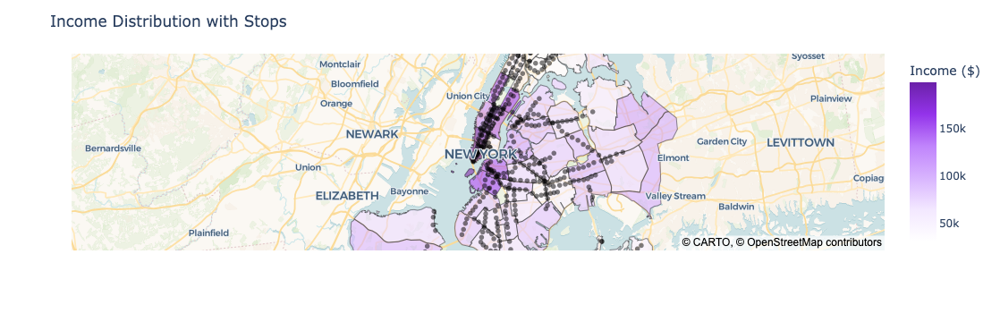

In [68]:
import plotly.express as px

from src.underserved_areas import generate_uniform_points_by_count, compute_dist_to_nearest_point

# Create choropleth map
final = px.choropleth_map(
    filtered_median_income_data,
    geojson=community_districts,
    featureidkey="properties.BoroCD",
    locations="Fips",
    color='Data',
    zoom=9,
    color_continuous_scale=lavender_white_scale,
    center={"lat": 40.7128, "lon": -74.0060},
    opacity=0.6,
    labels={'Data': 'Income ($)'}
)

# Make a scatter map where the color of the points is based on the distance to the nearest subway stop
# map_nyc = px.choropleth_map(
#     community_districts,
#     geojson=community_districts.geometry,
#     locations=community_districts.index,
#     color="Data",
#     center={"lat": 40.7128, "lon": -74.0060},
#     zoom=9,
#     height=600,
#     width=800,
# )


# Plot the subway stops on the map
final.add_trace(
    px.scatter_map(
        subway_stops_gdf,
        lat="stop_lat",
        lon="stop_lon",
        hover_name="stop_name",
        color_discrete_sequence=["black"],
        opacity=0.5,
    ).data[0]
)

# Update the layout to use OpenStreetMap style
final.update_layout(
    title_text="Income Distribution with Stops", 
    # mapbox_style="open-street-map",
)

final.show()